In [5]:
using HarmonicBalance

## Driven, damped harmonic oscillator

Solve full equation in time-domain

In [1]:
using DifferentialEquations

In [186]:
function HO!(dx,x,fixed,t)
    dx[1] = x[2]
    dx[2] = -fixed[ω0]^2*x[1] - fixed[γ]*x[2] + fixed[F0]*cos(fixed[ω]*t) 
end

x0 = [1.,0.]
tspan = (0.0,2000.0)

@variables ω, ω0, F0, t, γ # declare constant variables 
fixed = Dict(ω0 => 1.0, γ => 0.01, F0 => 0.1,  ω=>1.1) #fixed parameters in the simulation 
prob = DifferentialEquations.ODEProblem(HO!,x0,tspan,fixed)
sol = solve(prob,saveat=0.01);

plot(sol.t,sol[1,:],linewidth=5,label=nothing,xlabel="time",ylabel="x(t)")

Obtain Harmonic Equation and solve in time-domain (Runge-Kutta solver)

In [187]:
import HarmonicBalance.TimeEvolution: ODEProblem, DifferentialEquations.solve

In [188]:
@variables ω, ω0, F0, t, γ, x(t) # declare constant variables and a function x(t)
diff_eq = DifferentialEquation(d(x,t,2) + ω0^2*x + γ*d(x,t) ~ F0*cos(ω*t), x)#declare differential equation

add_harmonic!(diff_eq, x, ω) # specify the ansatz x = u(T) cos(ωt) + v(T) sin(ωt)
harmonic_eq = get_harmonic_equations(diff_eq)#

A set of 2 harmonic equations
Variables: u1(T), v1(T)
Parameters: γ, ω, ω0, F0

Harmonic ansatz: 
x(t) = u1(T)*cos(ωt) + v1(T)*sin(ωt)

Harmonic equations:

γ*Differential(T)(u1(T)) + (ω0^2)*u1(T) + γ*ω*v1(T) + (2//1)*ω*Differential(T)(v1(T)) - (ω^2)*u1(T) ~ F0

(ω0^2)*v1(T) + γ*Differential(T)(v1(T)) - (ω^2)*v1(T) - (2//1)*ω*Differential(T)(u1(T)) - γ*ω*u1(T) ~ 0


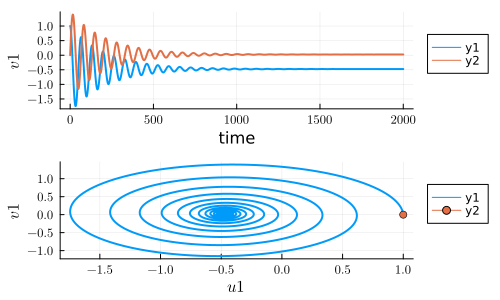

In [189]:
#set up problem and solve
ode_problem   = HarmonicBalance.TimeEvolution.ODEProblem(harmonic_eq, fixed, x0 = x0, timespan = (0,2000))
time_evo = solve(ode_problem, saveat=0.1);

p1 = plot(time_evo, "u1", harmonic_eq)
plot!(time_evo, "v1", harmonic_eq)
p2 = plot(time_evo, ["u1", "v1"], harmonic_eq)
plot!([x0[1]],[x0[2]],markers=:true,line=false)

plot(p1,p2,size=(500,300),layout=(2,1))


Check $x(t)$ out

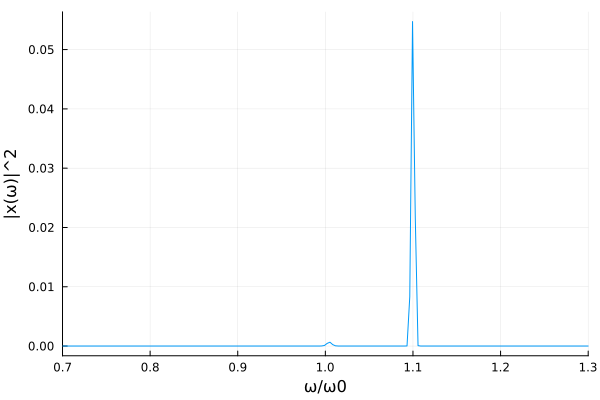

In [190]:
t  = time_evo.t
u1 = transform_solutions(time_evo,"u1", harmonic_eq)
v1 = transform_solutions(time_evo,"v1", harmonic_eq)

x1 = u1.*cos.(fixed[ω]*t) .+ v1.*sin.(fixed[ω]*t)
plot(t,x1,alpha=0.8,xlabel="time",ylabel="x(t)",legend=false)


fft_x,freqs = HarmonicBalance.FFT(x1,t)
plot(freqs,abs2.(fft_x[1]),xlim=[0.7,1.3],xlabel="ω/ω0",ylabel="|x(ω)|^2",legend=false)



Transient regime

In [191]:
plot(t,x1,label="HB",xlabel="time",ylabel="x(t)",alpha=0.8)
plot!(t,sqrt.(u1.^2+v1.^2),label="HB amplitude",xlabel="time")
plot!(sol.t,sol[1,:],label="exact",alpha=0.7,xlim=(0,500))

In [199]:
plot(t,x1,label="HB",xlabel="time",ylabel="x(t)",alpha=0.8)
plot!(t,sqrt.(u1.^2+v1.^2),label="HB amplitude",xlabel="time")
plot!(sol.t,sol[1,:],label="exact",alpha=0.7,xlim=(1800,2000),ylim=(-0.5,0.5),style=:dash,lw=3)

Find results as the solution to a steadystate problem

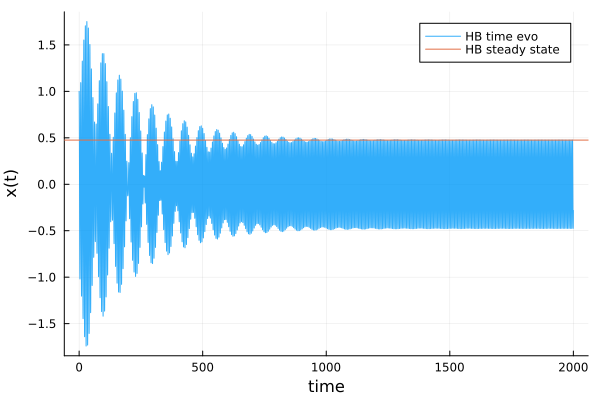

In [225]:
swept =  ω => [1.1,1.1]
res_steady = get_steady_states(harmonic_eq,swept,fixed)
A_steady = transform_solutions(res_steady,"sqrt(u1^2+v1^2)")
plot(t,x1,label="HB time evo",xlabel="time",ylabel="x(t)",alpha=0.8)
HarmonicBalance.hline!(real(A_steady[1]),label="HB steady state")


#print(res_steady)